In [1]:
import os
import sys
from pathlib import Path
from torch_geometric.loader import DataLoader

import json
import hydra
import numpy as np
import torch
import torch.nn as nn
import wandb
from omegaconf import DictConfig, OmegaConf
from functools import partial
import torch.nn.functional as F
import pdb

from infinity.utils.load_inr import load_inr_model
from infinity.utils.load_modulations import load_modulations
from infinity.data.dataset import GeometryDatasetFull, set_seed
from infinity.mlp import ResNet

In [9]:
import airfrans as af

In [2]:
import yaml

In [3]:
with open("../../training/config/regression.yaml") as f:
    cfg = DictConfig(yaml.safe_load(f))

In [11]:
LOAD_DIR = Path(os.getenv("WANDB_DIR")) / "airfrans" / task / "inr"
RESULTS_DIR = Path(os.getenv("WANDB_DIR")) / "airfrans" / task / "model"
MODULATIONS_DIR = Path(os.getenv("WANDB_DIR")) / "airfrans" / task / "modulations"


In [7]:
# data
data_dir = cfg.data.dir
task = cfg.data.task
data_to_encode = cfg.data.data_to_encode
score = cfg.data.score
ntrain = cfg.data.ntrain
ntest = cfg.data.ntest
seed = cfg.data.seed

# optim
batch_size = cfg.optim.batch_size
batch_size_val = (
    batch_size if cfg.optim.batch_size_val == None else cfg.optim.batch_size_val
)
epochs = cfg.optim.epochs
lr = cfg.optim.lr
weight_decay = cfg.optim.weight_decay

# inr
run_name_vx="crisp-disco-451"
run_name_vy="leafy-lion-452"
run_name_p="woven-mountain-453"
run_name_nu="pleasant-gorge-454"
run_name_sdf="dutiful-smoke-468"
run_name_n="soft-leaf-471"
run_name_fields="mild-sound-698"

# model
model_type = cfg.model.model_type
depth = cfg.model.depth
width = cfg.model.width
activation = cfg.model.activation

In [8]:
# train
with open(Path(data_dir) / "Dataset/manifest.json", "r") as f:
    manifest = json.load(f)

trainset = manifest[task + "_train"]
testset = manifest[task + "_test"] if task != "scarce" else manifest["full_test"]

ntrain = len(trainset)
ntest = len(testset)

tmp = torch.load(LOAD_DIR / "all_physics_fields" / f"{run_name_fields}.pt")
latent_dim = tmp["cfg"].inr.latent_dim

# default sample is none
trainset = GeometryDatasetFull(
    trainset,
    key=data_to_encode,
    latent_dim=latent_dim,
    norm=True,
    sample=None,
    n_boot=4000,
)
testset = GeometryDatasetFull(
    testset,
    key=data_to_encode,
    latent_dim=latent_dim,
    sample=None,
    n_boot=4000,
    coef_norm=trainset.coef_norm,
)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 800/800 [04:55<00:00,  2.71it/s]


coef_norm (array([ 5.0064105e-01,  1.1181436e-02,  6.1606461e+01,  4.8862386e+00,
        2.3173042e-01, -1.6572434e-03, -8.5309672e-05], dtype=float32), array([ 0.7040743 ,  0.33643225, 17.757267  ,  6.2838936 ,  0.47521183,
        0.04159059,  0.06237248], dtype=float32), array([ 4.2485832e+01,  9.7596407e+00, -4.5211685e+02,  7.9553854e-04],
      dtype=float32), array([2.9667524e+01, 3.0894947e+01, 2.9469661e+03, 2.9265855e-03],
      dtype=float32))


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [01:12<00:00,  2.75it/s]


coef_norm (array([ 5.0064105e-01,  1.1181436e-02,  6.1606461e+01,  4.8862386e+00,
        2.3173042e-01, -1.6572434e-03, -8.5309672e-05], dtype=float32), array([ 0.7040743 ,  0.33643225, 17.757267  ,  6.2838936 ,  0.47521183,
        0.04159059,  0.06237248], dtype=float32), array([ 4.2485832e+01,  9.7596407e+00, -4.5211685e+02,  7.9553854e-04],
      dtype=float32), array([2.9667524e+01, 3.0894947e+01, 2.9469661e+03, 2.9265855e-03],
      dtype=float32))


In [12]:
device = torch.device("cuda")

# load inr and modulations

inr_fields, alpha_fields = load_inr_model(
    LOAD_DIR / "all_physics_fields", run_name_fields, input_dim=3, output_dim=4
)

inr_sdf, alpha_sdf = load_inr_model(
    LOAD_DIR / "sdf", run_name_sdf, input_dim=2, output_dim=1
)
inr_n, alpha_n = load_inr_model(
    LOAD_DIR / "n", run_name_n, input_dim=2, output_dim=2
)

mod_fields = load_modulations(
    trainset, testset, inr_fields, MODULATIONS_DIR, run_name_fields, "all_physics_fields", alpha=alpha_fields
)

mod_sdf = load_modulations(
    trainset,
    testset,
    inr_sdf,
    MODULATIONS_DIR,
    run_name_sdf,
    "sdf",
    alpha=alpha_sdf,
    input_dim=2,
)
mod_n = load_modulations(
    trainset,
    testset,
    inr_n,
    MODULATIONS_DIR,
    run_name_n,
    "n",
    alpha=alpha_n,
    input_dim=2,
)

gamma = 1

mu_fields = mod_fields["z_train"].mean(0)
sigma_fields = mod_fields["z_train"].std(0) * gamma

mu_sdf = mod_sdf["z_train"].mean(0)
sigma_sdf = mod_sdf["z_train"].std(0)

mu_n = mod_n["z_train"].mean(0)
sigma_n = mod_n["z_train"].std(0)


trainset.out_modulations["fields"] = (mod_fields["z_train"] - mu_fields) / sigma_fields

trainset.in_modulations["sdf"] = (mod_sdf["z_train"] - mu_sdf) / sigma_sdf
trainset.in_modulations["n"] = (mod_n["z_train"] - mu_n) / sigma_n

testset.out_modulations["fields"] = (mod_fields["z_test"] - mu_fields) / sigma_fields

testset.in_modulations["sdf"] = (mod_sdf["z_test"] - mu_sdf) / sigma_sdf
testset.in_modulations["n"] = (mod_n["z_test"] - mu_n) / sigma_n

train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True)
# test

model = ResNet(
    input_dim=latent_dim + 2,
    hidden_dim=width,
    output_dim=latent_dim,
    depth=depth,
    dropout=0.0,
    activation=activation,).cuda()

In [18]:
mu_fields = mu_fields.cuda()
sigma_fields = sigma_fields.cuda()

In [15]:
run_name_mlp = "cosmic-hill-1291"
model_ckpt = torch.load(RESULTS_DIR / f"{run_name_mlp}.pt")
model.load_state_dict(model_ckpt['model'])
model.eval()

ResNet(
  (net): Sequential(
    (0): ResBlock(
      (linear1): Linear(in_features=258, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=258, bias=True)
      (activation1): Swish()
      (activation2): Swish()
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (1): ResBlock(
      (linear1): Linear(in_features=258, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=258, bias=True)
      (activation1): Swish()
      (activation2): Swish()
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (2): ResBlock(
      (linear1): Linear(in_features=258, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=258, bias=True)
      (activation1): Swish()
      (activation2): Swish()
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (3): ResBlock(
      (linear1): Linear(in_features=258, out_features=256, bias=True)
      (linear2): Linear(in_features=256, out_features=258, bias=True)
  

In [16]:
test_loader = DataLoader(testset, batch_size=1, shuffle=False)

In [19]:
code_train_mse = 0
code_test_mse = 0
vx_train_mse = 0
vx_test_mse = 0
vy_train_mse = 0
vy_test_mse = 0
p_train_mse = 0
p_test_mse = 0
p_surf_train_mse = 0
p_surf_test_mse = 0
nu_train_mse = 0
nu_test_mse = 0

for substep, (graph, idx) in enumerate(test_loader):
    model.eval()
    graph = graph.cuda()
    n_samples = len(graph)

    ipt = torch.cat(
        [
            graph.z_sdf,
            #graph.z_n,
            graph.inlet_x.unsqueeze(-1),
            graph.inlet_y.unsqueeze(-1),
        ],
        axis=-1,
    )

    with torch.no_grad():
        z_pred = model(ipt)
        loss = ((z_pred - graph.z_fields) ** 2).mean()
        code_test_mse += loss.item() * n_samples

    mask = ...
    mask_surf = graph.surface

    images = torch.cat([graph.vx, graph.vy, graph.p, graph.nu], axis=-1)

    pos = torch.cat([graph.pos, graph.sdf], axis=-1)
    with torch.no_grad():
        pred = inr_fields.modulated_forward(pos[mask], z_pred[graph.batch] * sigma_fields + mu_fields)
        pred_surf = inr_fields.modulated_forward(pos[graph.surface], z_pred[graph.batch[graph.surface]] * sigma_fields + mu_fields)

    mse = ((pred - images[mask])**2).mean(0)

    vx_test_mse += mse[0] * n_samples
    vy_test_mse += mse[1] * n_samples
    p_test_mse += mse[2] * n_samples
    nu_test_mse += mse[3] * n_samples
    p_surf_test_mse += ((pred_surf[..., 2] - images[graph.surface, 2])**2).mean() * n_samples
    
    break


In [22]:
vx_test_mse

tensor(0.0005, device='cuda:0')

In [23]:
vy_test_mse

tensor(0.0003, device='cuda:0')

In [24]:
p_test_mse

tensor(0.0003, device='cuda:0')

In [25]:
nu_test_mse

tensor(0.0018, device='cuda:0')

In [26]:
p_surf_test_mse

tensor(0.0006, device='cuda:0')

# plot on the volume

In [27]:
graph.pos.shape

torch.Size([179033, 2])

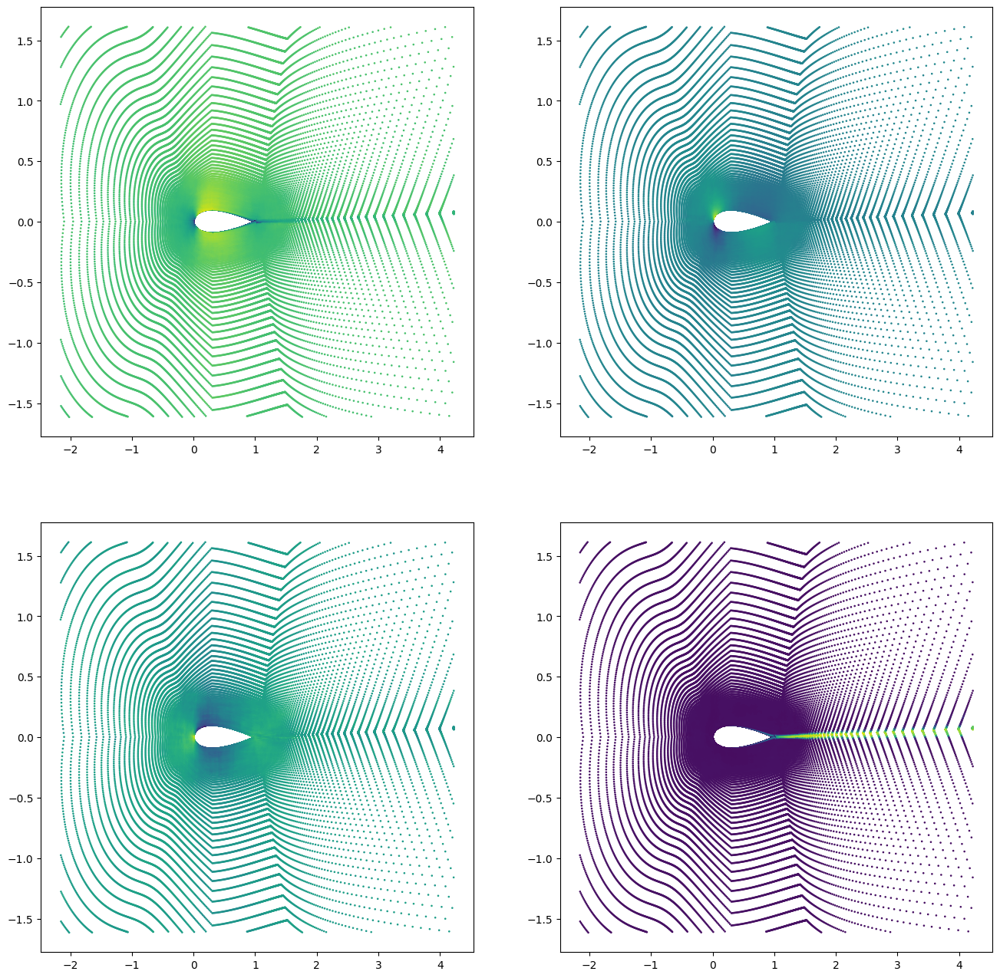

In [31]:
import matplotlib.pyplot as plt

pred_plt = pred.cpu().detach()
pos = graph.pos.cpu().detach()

fig, ax = plt.subplots(2, 2, figsize = (16, 16))
ax[0, 0].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 0], s = 0.75)
ax[0, 1].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 1], s = 0.75)
ax[1, 0].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 2], s = 0.75)
ax[1, 1].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 3], s = 0.75)
#ax[1, 1].scatter(simulation.airfoil_position[:, 0], simulation.airfoil_position[:, 1], c = simulation.airfoil_normals[:, 0], s = 0.75)
#ax[1, 2].scatter(simulation.airfoil_position[:, 0], simulation.airfoil_position[:, 1], c = simulation.airfoil_normals[:, 1], s = 0.75)

In [32]:
graph


DataBatch(pos=[179033, 2], inlet_x=[1], inlet_y=[1], sdf=[179033, 1], nx=[179033, 1], ny=[179033, 1], x=[179033, 5], vx=[179033, 1], vy=[179033, 1], p=[179033, 1], nu=[179033, 1], z_vx=[1, 256], z_vy=[1, 256], z_p=[1, 256], z_nu=[1, 256], z_sdf=[1, 256], z_n=[1, 256], z_fields=[1, 256], z=[1, 1024], surface=[179033], batch=[179033], ptr=[2])

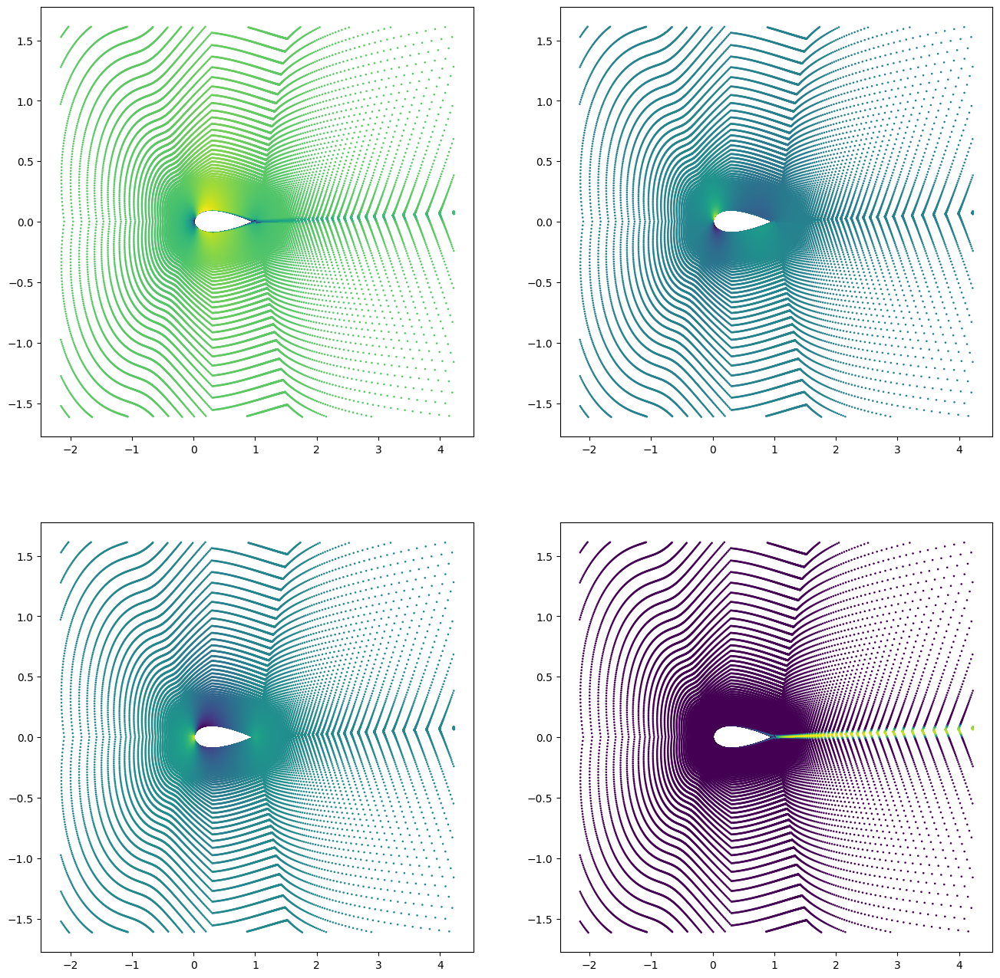

In [34]:
import matplotlib.pyplot as plt

pred_plt = pred.cpu().detach()
pos = graph.pos.cpu().detach()

fig, ax = plt.subplots(2, 2, figsize = (16, 16))
ax[0, 0].scatter(pos[:, 0], pos[:, 1], c = graph.vx.cpu().detach(), s = 0.75)
ax[0, 1].scatter(pos[:, 0], pos[:, 1], c = graph.vy.cpu().detach(), s = 0.75)
ax[1, 0].scatter(pos[:, 0], pos[:, 1], c = graph.p.cpu().detach(), s = 0.75)
ax[1, 1].scatter(pos[:, 0], pos[:, 1], c = graph.nu.cpu().detach(), s = 0.75)
#ax[1, 1].scatter(simulation.airfoil_position[:, 0], simulation.airfoil_position[:, 1], c = simulation.airfoil_normals[:, 0], s = 0.75)
#ax[1, 2].scatter(simulation.airfoil_position[:, 0], simulation.airfoil_position[:, 1], c = simulation.airfoil_normals[:, 1], s = 0.75)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


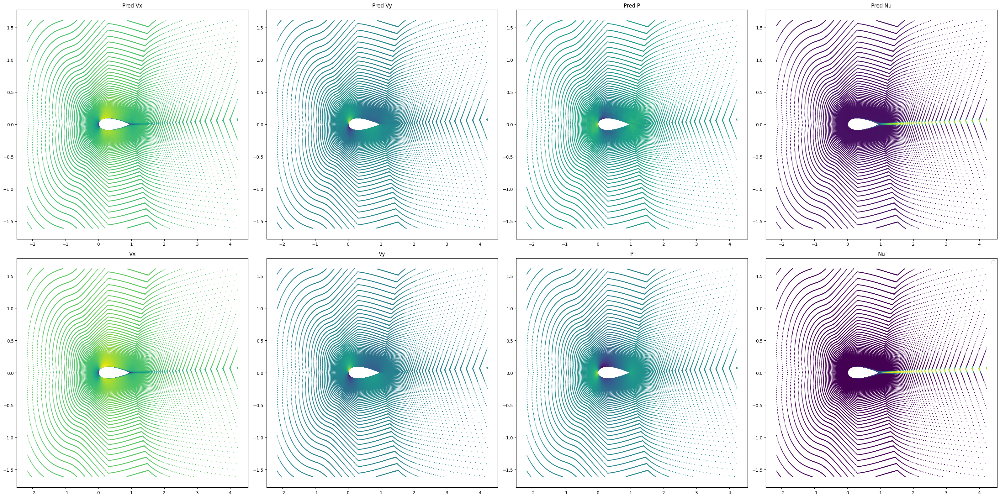

In [37]:
import matplotlib.pyplot as plt

pred_plt = pred.cpu().detach()
pos = graph.pos.cpu().detach()

fig, ax = plt.subplots(2, 4, figsize = (32, 16))
ax[0, 0].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 0], s = 0.75)
ax[0, 1].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 1], s = 0.75)
ax[0, 2].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 2], s = 0.75)
ax[0, 3].scatter(pos[:, 0], pos[:, 1], c = pred_plt[..., 3], s = 0.75)
ax[1, 0].scatter(pos[:, 0], pos[:, 1], c = graph.vx.cpu().detach(), s = 0.75)
ax[1, 1].scatter(pos[:, 0], pos[:, 1], c = graph.vy.cpu().detach(), s = 0.75)
ax[1, 2].scatter(pos[:, 0], pos[:, 1], c = graph.p.cpu().detach(), s = 0.75)
ax[1, 3].scatter(pos[:, 0], pos[:, 1], c = graph.nu.cpu().detach(), s = 0.75)

titles = [
    "Pred Vx", "Pred Vy", "Pred P", "Pred Nu",
    "Vx", "Vy", "P", "Nu"
]
for i in range(2):
    for j in range(4):
        ax[i, j].set_title(titles[i * 4 + j])

# Adjust spacing between subplots (optional)
plt.tight_layout()

# Save the figure as a PNG image
fig.savefig("plots/volume_sample0.png")
#ax[1, 1].scatter(simulation.airfoil_position[:, 0], simulation.airfoil_position[:, 1], c = simulation.airfoil_normals[:, 0], s = 0.75)
#ax[1, 2].scatter(simulation.airfoil_position[:, 0], simulation.airfoil_position[:, 1], c = simulation.airfoil_normals[:, 1], s = 0.75)

# Simulation

In [40]:
simulation = af.Simulation(root = Path(data_dir) / "Dataset/", name = 'airFoil2D_SST_31.812_1.334_0.371_3.287_0.0_19.548', T = 298.15)

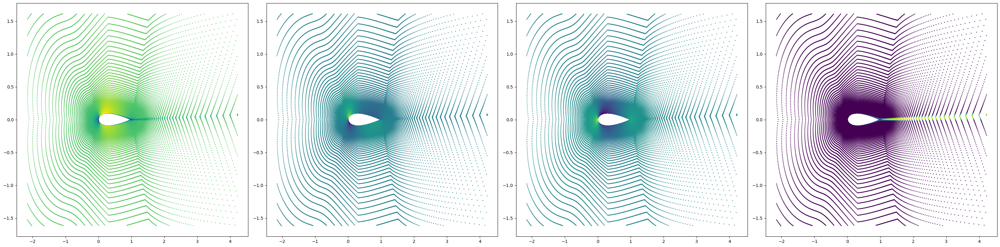

In [49]:
fig, ax = plt.subplots(1, 4, figsize = (32, 8))
ax[0].scatter(simulation.position[:, 0], simulation.position[:, 1], c = simulation.velocity[:, 0], s = 0.75)
ax[1].scatter(simulation.position[:, 0], simulation.position[:, 1], c = simulation.velocity[:, 1], s = 0.75)
ax[2].scatter(simulation.position[:, 0], simulation.position[:, 1], c = simulation.pressure[:, 0], s = 0.75)
ax[3].scatter(simulation.position[:, 0], simulation.position[:, 1], c = simulation.nu_t[:, 0], s = 0.75)
plt.tight_layout()

In [51]:
simulation.pressure.mean()

66.46934425855582

In [53]:
coef_norm=trainset.coef_norm

In [52]:
graph.p.mean()

tensor(0.1760, device='cuda:0')

In [57]:
boundary_layer[0].shape

(1001,)

In [58]:
boundary_layer[1].shape

(1001,)

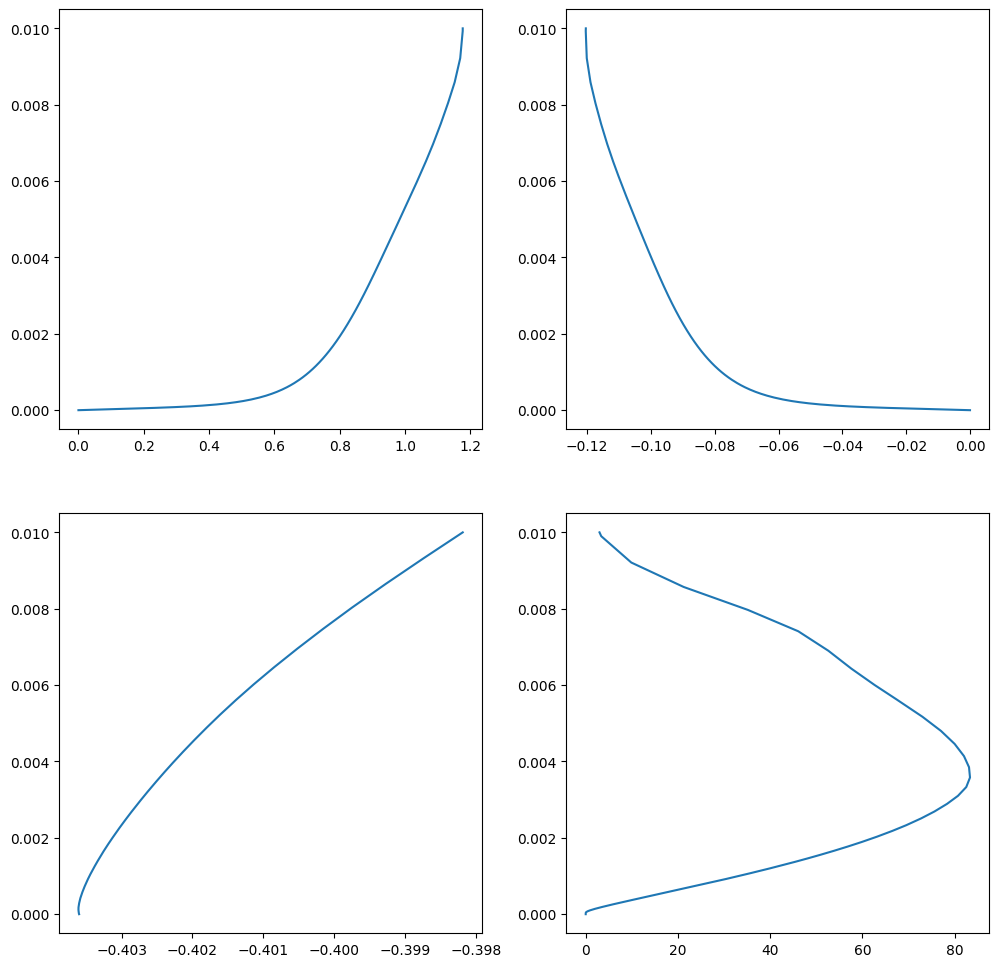

In [63]:
boundary_layer = simulation.boundary_layer(x = 0.5, y = 0.01)

# Plot the sampling with matplotlib
fig, ax = plt.subplots(2, 2, figsize = (12, 12))
ax[0, 0].plot(boundary_layer[1], boundary_layer[0])
ax[0, 1].plot(boundary_layer[2], boundary_layer[0])
ax[1, 0].plot(boundary_layer[3], boundary_layer[0])
ax[1, 1].plot(boundary_layer[4], boundary_layer[0])

In [66]:
simulation.velocity.shape

(179033, 2)

In [65]:
pred_plt[..., 2].shape

torch.Size([179033])

In [70]:
coef_norm

(array([ 5.0064105e-01,  1.1181436e-02,  6.1606461e+01,  4.8862386e+00,
         2.3173042e-01, -1.6572434e-03, -8.5309672e-05], dtype=float32),
 array([ 0.7040743 ,  0.33643225, 17.757267  ,  6.2838936 ,  0.47521183,
         0.04159059,  0.06237248], dtype=float32),
 array([ 4.2485832e+01,  9.7596407e+00, -4.5211685e+02,  7.9553854e-04],
       dtype=float32),
 array([2.9667524e+01, 3.0894947e+01, 2.9469661e+03, 2.9265855e-03],
       dtype=float32))

In [86]:
simulation.pressure = pred_plt[..., 2][..., None]*coef_norm[3][2] + coef_norm[2][2] #pred_plt[..., 2][..., None] #graph.p.cpu().detach()
simulation.velocity[..., 0] = pred_plt[..., 0]*coef_norm[3][0] + coef_norm[2][0] #pred_plt[..., 0]graph.p.cpu().detach()
simulation.velocity[..., 1] = pred_plt[..., 1]*coef_norm[3][1] + coef_norm[2][1] #pred_plt[..., 1]
simulation.nu_t = pred_plt[..., 3][...,None]*coef_norm[3][3] + coef_norm[2][3]#pred_plt[..., 3][..., None]

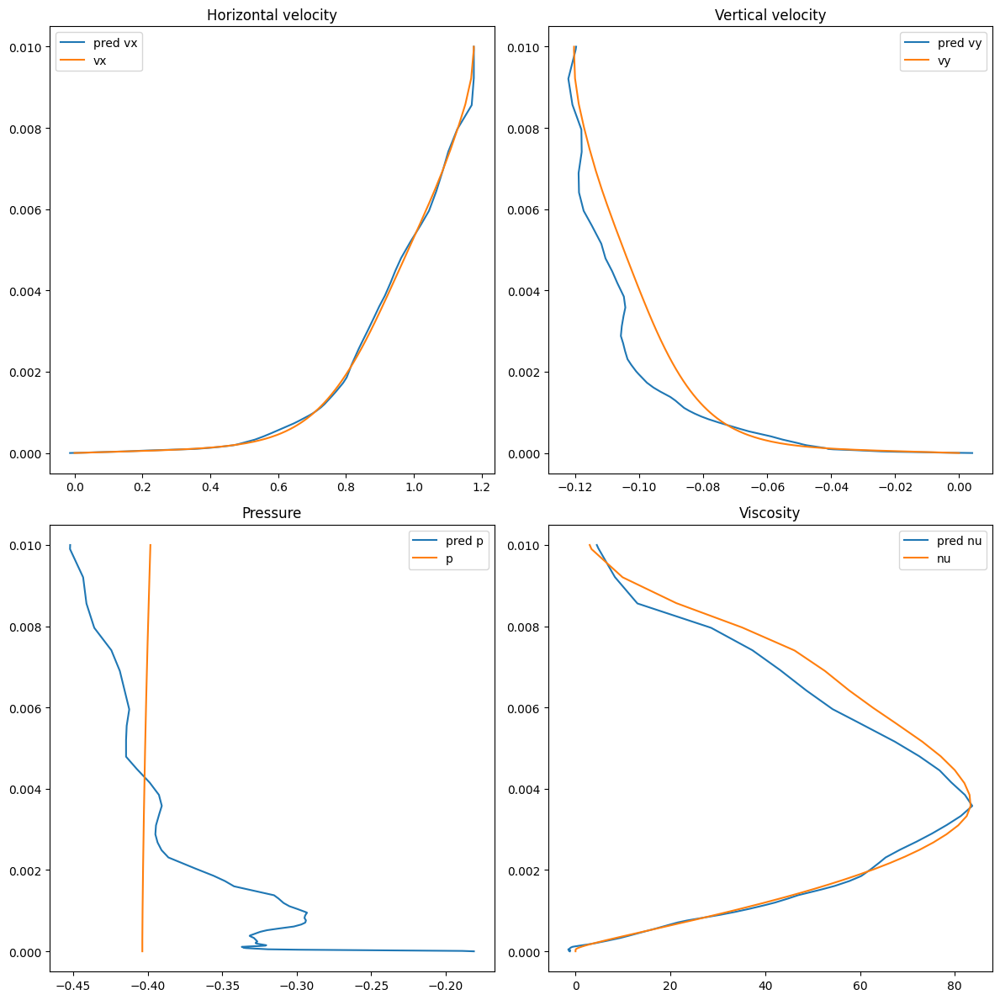

In [90]:
boundary_layer_2 = simulation.boundary_layer(x = 0.5, y = 0.01)

# Plot the sampling with matplotlib
fig, ax = plt.subplots(2, 2, figsize = (12, 12))
ax[0, 0].plot(boundary_layer_2[1], boundary_layer[0], label="pred vx")
ax[0, 1].plot(boundary_layer_2[2], boundary_layer[0], label="pred vy")
ax[1, 0].plot(boundary_layer_2[3], boundary_layer[0], label="pred p")
ax[1, 1].plot(boundary_layer_2[4], boundary_layer[0], label="pred nu")
ax[0, 0].plot(boundary_layer[1], boundary_layer[0], label="vx")
ax[0, 1].plot(boundary_layer[2], boundary_layer[0], label="vy")
ax[1, 0].plot(boundary_layer[3], boundary_layer[0], label="p")
ax[1, 1].plot(boundary_layer[4], boundary_layer[0], label="nu")

ax[0, 0].set_title("Horizontal velocity")
ax[0, 1].set_title("Vertical velocity")
ax[1, 0].set_title("Pressure")
ax[1, 1].set_title("Viscosity")

ax[0, 0].legend()
ax[0, 1].legend()
ax[1, 0].legend()
ax[1, 1].legend()

plt.tight_layout()
fig.savefig("plots/boundarylayer_sample0.png")

In [100]:
simulation = af.Simulation(root = Path(data_dir) / "Dataset/", name = 'airFoil2D_SST_31.812_1.334_0.371_3.287_0.0_19.548', T = 298.15)
norm_wss = np.linalg.norm(simulation.wallshearstress()[simulation.surface], axis = 1)

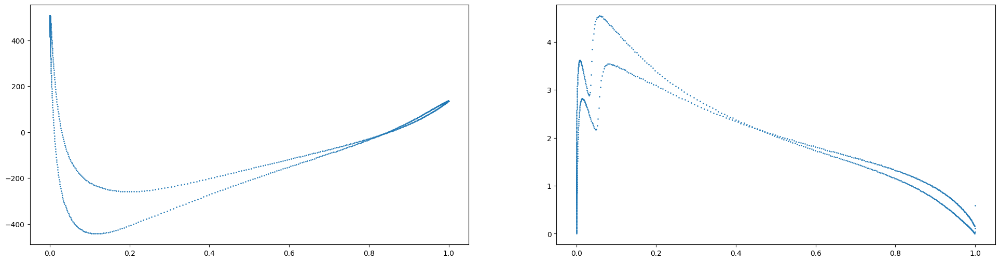

In [101]:
# Plot the sampling with matplotlib
fig, ax = plt.subplots(1, 2, figsize = (24, 6))
true_pressure = simulation.pressure
ax[0].scatter(simulation.position[simulation.surface, 0], true_pressure[simulation.surface, 0], s=0.75)
ax[1].scatter(simulation.position[simulation.surface, 0], norm_wss, s=0.75)

In [102]:
simulation = af.Simulation(root = Path(data_dir) / "Dataset/", name = 'airFoil2D_SST_31.812_1.334_0.371_3.287_0.0_19.548', T = 298.15)
simulation.pressure = pred_plt[..., 2][..., None]*coef_norm[3][2] + coef_norm[2][2] #pred_plt[..., 2][..., None] #graph.p.cpu().detach()
simulation.velocity[..., 0] = pred_plt[..., 0]*coef_norm[3][0] + coef_norm[2][0] #pred_plt[..., 0]graph.p.cpu().detach()
simulation.velocity[..., 1] = pred_plt[..., 1]*coef_norm[3][1] + coef_norm[2][1] #pred_plt[..., 1]
simulation.nu_t = pred_plt[..., 3][...,None]*coef_norm[3][3] + coef_norm[2][3]#pred_plt[..., 3][..., None]
norm_wss2 = np.linalg.norm(simulation.wallshearstress()[simulation.surface], axis = 1)

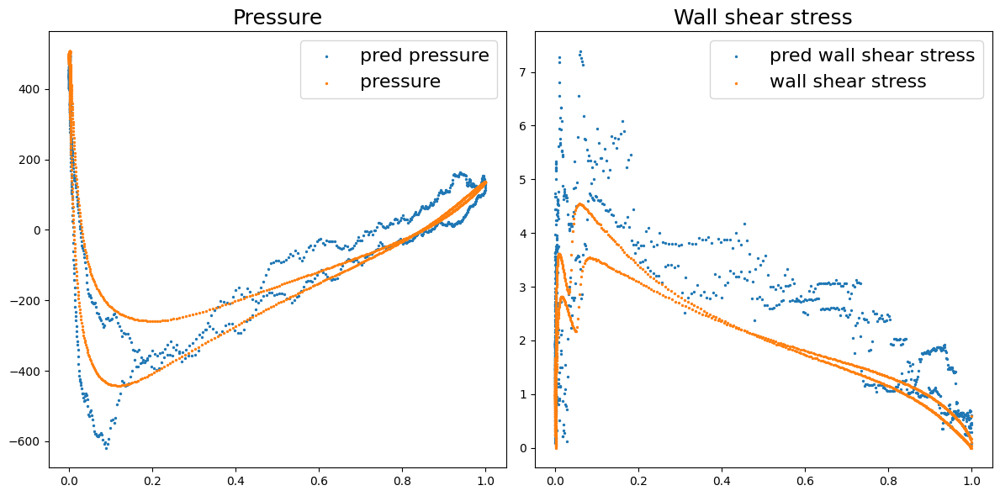

In [109]:
# Plot the sampling with matplotlib
fig, ax = plt.subplots(1, 2, figsize = (12, 6))
#true_pressure = simulation.pressure
ax[0].scatter(simulation.position[simulation.surface, 0], simulation.pressure[simulation.surface, 0], s=2, label="pred pressure")
ax[1].scatter(simulation.position[simulation.surface, 0], norm_wss2, s=2, label="pred wall shear stress")
ax[0].scatter(simulation.position[simulation.surface, 0], true_pressure[simulation.surface, 0], s=2, label="pressure")
ax[1].scatter(simulation.position[simulation.surface, 0], norm_wss, s=2, label="wall shear stress")
ax[0].set_title("Pressure", fontsize=18)
ax[1].set_title("Wall shear stress", fontsize=18)

ax[0].legend(fontsize=16)
ax[1].legend(fontsize=16)


plt.tight_layout()
fig.savefig("plots/surfaceplot_sample0.png")